## Final Project: Phase 2
Spring 2024  
Group: Michael Massone and Joseph Nelson Farrell   
DS 5230 Unsupervised Machine Learning  
Professor Steven Morin, PhD  
Due: 03/11/2024  
___

### Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import os
import sys
from pathlib import Path
from sklearn.preprocessing import LabelEncoder

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

___

### Define File Paths

In [2]:
# define path
nb_path = Path(os.getcwd())
print(nb_path)
path = str(nb_path.parent)
print(path)

# path to figs folder
figs_path = path + '/figs'

# path to data
data_path= path + '/data'

# path to src folder
src_path = path + '/src'
print(src_path)

# sys path
sys.path.append(src_path)

/Users/mikey/LocalFiles/DS5230/final_project/DS5230-final/notebooks
/Users/mikey/LocalFiles/DS5230/final_project/DS5230-final
/Users/mikey/LocalFiles/DS5230/final_project/DS5230-final/src


___

### Functions

In [3]:
from missingness_filter import missingness_cols
from ml_attributes import column_dtypes

___

### Parameters

In [4]:
# design matrix csv file name
design_matrix_file_name = "/curated/beans_design.csv"

# missingness threshold for determining columns to drop
missingness_threshold = 0.20

___

### Load Data

In [5]:
# read in design matrix
design_df = pd.read_csv( data_path + design_matrix_file_name)

___

### Identify Columns with Missing Value Count Above Threshold

In [6]:
# check columns for missingness
cols_to_drop_list = missingness_cols(design_df, missingness_threshold)

# display results
if cols_to_drop_list == []:
    print(f'There are no columns that require dropping based on missingness')
else:
    print(f'The following columns have a missingness proportion greater than {missingness_threshold}.')
    print(f'These columns should be dropped:')
    for i in range(len(cols_to_drop_list)):
        print(f'\t{i + 1}. {cols_to_drop_list[i]}')

There are no columns that require dropping based on missingness


Visually inspect design matrix:

In [7]:
design_df.head(10)

,Unnamed: 0,id,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,0,0,28395.0,610.291,208.178117,173.888747,1.197191,0.549812,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724
1,1,1,28734.0,638.018,200.524796,182.734419,1.097356,0.411785,29172.0,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430
2,2,2,29380.0,624.110,212.826130,175.931143,1.209713,0.562727,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066
3,3,3,30008.0,645.884,210.557999,182.516516,1.153638,0.498616,30724.0,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199
4,4,4,30140.0,620.134,201.847882,190.279279,1.060798,0.333680,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166
5,5,5,30279.0,634.927,212.560556,181.510182,1.171067,0.520401,30600.0,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236
6,6,6,30477.0,670.033,211.050155,184.039050,1.146768,0.489478,30970.0,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049
7,7,7,30519.0,629.727,212.996755,182.737204,1.165591,0.513760,30847.0,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345
8,8,8,30685.0,635.681,213.534145,183.157146,1.165852,0.514081,31044.0,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953
9,9,9,30834.0,631.934,217.227813,180.897469,1.200834,0.553642,31120.0,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061


Check for categorical features:

In [8]:
# get nominal and numerical columns, print column dtype
nominal_cols, numerical_cols, unique_value_cols = column_dtypes(design_df)

# display results
if nominal_cols == []:
    print(f'There no nominal columns in the dataset.\n')
else:
    print(f'The nominal columns are:')
    for i in range(len(nominal_cols)):
        print(f'{i + 1}: {nominal_cols[i]}')

if numerical_cols == []:
    print(f'There no numerical columns in the dataset.')
else:
    print(f'The {len(numerical_cols)} numerical columns are:')
    for i in range(len(numerical_cols)):
        print(f'\t{i + 1}: {numerical_cols[i]}')

if unique_value_cols == []:
    print(f'\nThere no columns with all unique values in the dataset.')
else:
    print(f'\nThe {len(unique_value_cols)} columns with all unique values are:')
    for i in range(len(unique_value_cols)):
        print(f'\t{i + 1}: {unique_value_cols[i]}')

********************************************************

The column: Unnamed: 0 is data type int64
Unique value count: 13611, DF length: 13611, Ratio: 1.0
***
FLAG column Unnamed: 0 for review 
***
The column: id is data type int64
Unique value count: 13611, DF length: 13611, Ratio: 1.0
***
FLAG column id for review 
***
The column: Area is data type float64
Unique value count: 12011, DF length: 13611, Ratio: 0.88
The column: Perimeter is data type float64
Unique value count: 13413, DF length: 13611, Ratio: 0.99
The column: MajorAxisLength is data type float64
Unique value count: 13543, DF length: 13611, Ratio: 1.0
The column: MinorAxisLength is data type float64
Unique value count: 13543, DF length: 13611, Ratio: 1.0
The column: AspectRation is data type float64
Unique value count: 13543, DF length: 13611, Ratio: 1.0
The column: Eccentricity is data type float64
Unique value count: 13543, DF length: 13611, Ratio: 1.0
The column: ConvexArea is data type float64
Unique value count: 120

Create non machine learning attributes list

In [9]:
design_df.columns

Index(['Unnamed: 0', 'id', 'Area', 'Perimeter', 'MajorAxisLength',
       'MinorAxisLength', 'AspectRation', 'Eccentricity', 'ConvexArea',
       'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness',
       'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4'],
      dtype='object')

In [10]:


# attributes not to be used for machine learning
non_ml_attr_list = ['id']
for col in non_ml_attr_list:
    if col in nominal_cols:
        nominal_cols.remove(col)
    if col in numerical_cols:
        numerical_cols.remove(col)

# add any attributes that should be dropped from dataframe
drop_list = ['Unnamed: 0'] + cols_to_drop_list # 'Unnamed: 0' is a secondary id column and can be dropped. 


# drop cols in drop_list from design matrix
cols1 = design_df.columns
design_df.drop(drop_list, axis=1, inplace=True)
assert(len(design_df.columns) != len(cols1))

# drop col names in drop_list from nominal and numerical lists
for col in drop_list:
    if col in nominal_cols:
        nominal_cols.remove(col)
    if col in numerical_cols:
        numerical_cols.remove(col)
assert(design_df.shape[1] == len(non_ml_attr_list) + len(numerical_cols) + len(nominal_cols))


print('training X dimensions:', design_df.shape)
print('non_ml_attr_list', non_ml_attr_list)
print('numerical_cols', numerical_cols)
print('nominal_cols', nominal_cols)




training X dimensions: (13611, 17)
non_ml_attr_list ['id']
numerical_cols ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
nominal_cols []


SHow missingness of machine learning attributes:

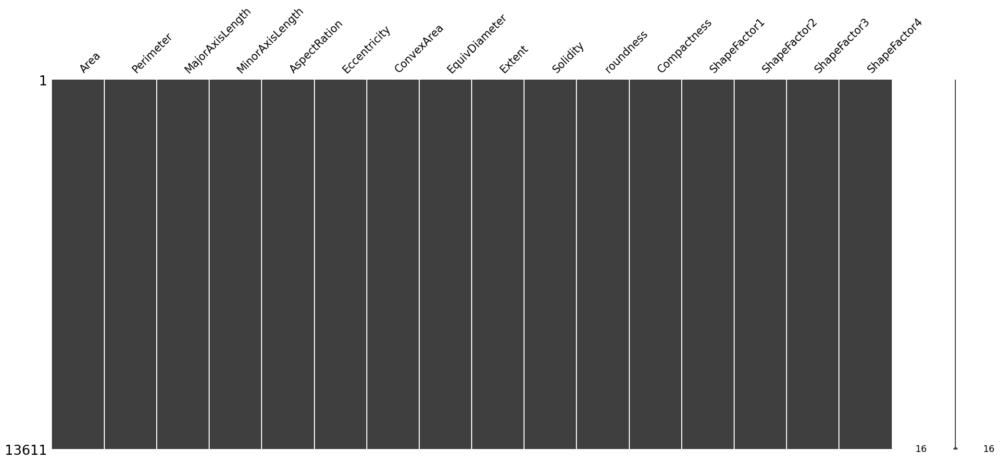

In [11]:
msno.matrix(design_df[numerical_cols + nominal_cols])
plt.show()

In [12]:
print('machine learning attributes datatypes:')
design_df[numerical_cols + nominal_cols].dtypes

machine learning attributes datatypes:


Area               float64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea         float64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
dtype: object

Calculate covariance and VIF of numerical attributes:

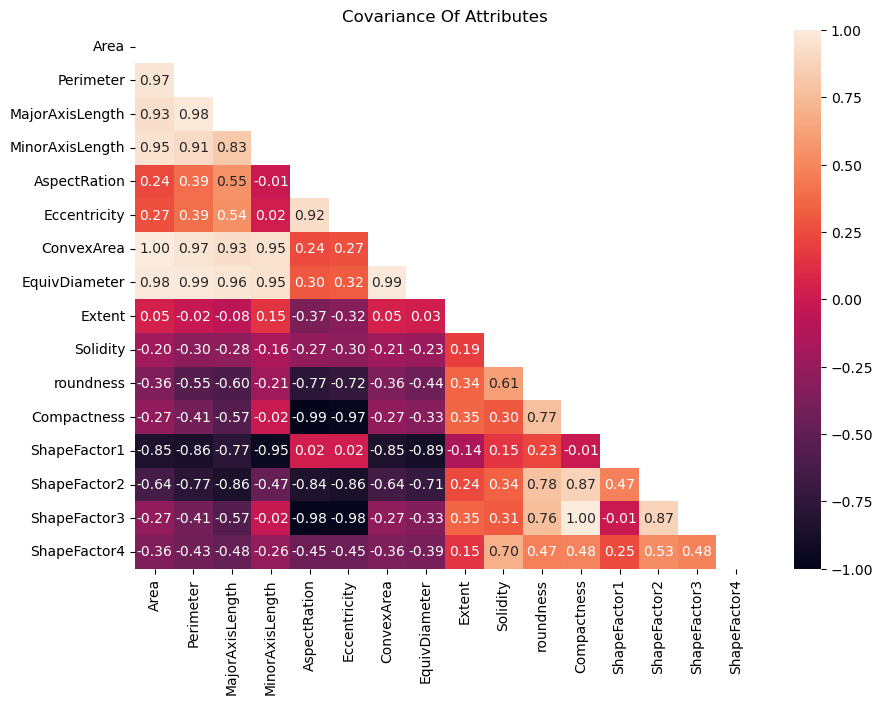

In [13]:
# set figure size
plt.figure(figsize=(10,7))

# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(design_df[numerical_cols].corr(), dtype=bool))

# generate heatmap
sns.heatmap(design_df[numerical_cols].corr(), annot=True, fmt=".2f", mask=mask, vmin=-1, vmax=1)
plt.title('Covariance Of Attributes')
plt.show();


In [14]:
def compute_vif(design_df, numerical_cols):
    
    X = design_df.loc[:,numerical_cols]

    # the calculation of variance inflation requires a constant
    X['intercept'] = 1
    
    # create dataframe to store vif values
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='intercept']


    print('Variance Inflation Factors Above Threshold(5):\n')
    print(vif[vif['VIF'] > 5])

    print('\n\nVariance Inflation Factors Below Threshold(5):\n')
    print(vif[vif['VIF'] <= 5])

    return vif

vif = compute_vif(design_df, numerical_cols)


Variance Inflation Factors Above Threshold(5):

           Variable            VIF
0              Area   81390.772240
1         Perimeter    3573.980197
2   MajorAxisLength   87936.513102
3   MinorAxisLength   77482.673330
4      AspectRation   13918.856718
5      Eccentricity    1183.004420
6        ConvexArea   78552.516774
7     EquivDiameter  314929.768895
9          Solidity      14.053550
10        roundness     104.028512
11      Compactness  276769.624251
12     ShapeFactor1     607.175671
13     ShapeFactor2    1245.330594
14     ShapeFactor3  200286.806522
15     ShapeFactor4      67.043776


Variance Inflation Factors Below Threshold(5):

  Variable       VIF
8   Extent  1.241536


Recaculate VIF without Shapefactor Attributes

In [15]:
vif = compute_vif(design_df, numerical_cols[:12])


Variance Inflation Factors Above Threshold(5):

           Variable           VIF
0              Area  55455.469502
1         Perimeter   3369.110823
2   MajorAxisLength   8280.492793
3   MinorAxisLength   5661.863735
4      AspectRation    430.562583
5      Eccentricity    176.949307
6        ConvexArea  55945.114110
7     EquivDiameter  26144.294906
9          Solidity     10.649496
10        roundness     98.457059
11      Compactness    999.791946


Variance Inflation Factors Below Threshold(5):

  Variable       VIF
8   Extent  1.238184


## Build Pipeline

Impute and scale the numerical attribute columns:

In [16]:
numerical_transformer = Pipeline(
    steps=[
            ('imputer', SimpleImputer()),
            ('scaler', StandardScaler())
    ]
)

Determine min frequency for nominal transformer:

In [17]:
if len(nominal_cols) > 0:
    print(design_df[nominal_cols].value_count())
    print('Set min_frequency for nominal transformer')
    min_frequency = int(input("min_frequency = "))
else:
    min_frequency = None


Nominal transformer imputes and encodes:

In [18]:
nominal_transformer = Pipeline(
    steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('onehot_encoder', OneHotEncoder(sparse_output=False, min_frequency=min_frequency))
    ]
)


Column transformer:

In [19]:
preprocessor = ColumnTransformer(
        transformers=[
            ('numerical', numerical_transformer, numerical_cols),
            ('nominal', nominal_transformer, nominal_cols)
        ]
)

Put design_df through the pipe:

In [20]:
trans_df = pd.DataFrame(
    data=preprocessor.fit_transform(design_df),
    index=design_df.index, # KEEP TRACK OF INDEX
    columns=preprocessor.get_feature_names_out() #NAME COlumns
)

trans_df

,numerical__Area,numerical__Perimeter,numerical__MajorAxisLength,numerical__MinorAxisLength,numerical__AspectRation,numerical__Eccentricity,numerical__ConvexArea,numerical__EquivDiameter,numerical__Extent,numerical__Solidity,numerical__roundness,numerical__Compactness,numerical__ShapeFactor1,numerical__ShapeFactor2,numerical__ShapeFactor3,numerical__ShapeFactor4
0,-0.840749,-1.143319,-1.306598,-0.631153,-1.565053,-2.185720,-0.841451,-1.063341,0.289087,0.367613,1.423867,1.839116,0.680786,2.402173,1.925723,0.838371
1,-0.829188,-1.013924,-1.395911,-0.434445,-1.969784,-3.686040,-0.826102,-1.044217,0.697477,-0.462907,0.231054,2.495449,0.367967,3.100893,2.689702,0.771138
2,-0.807157,-1.078829,-1.252357,-0.585735,-1.514291,-2.045336,-0.808704,-1.008084,0.578195,0.518417,1.252865,1.764843,0.603129,2.235091,1.841356,0.916755
3,-0.785741,-0.977215,-1.278825,-0.439290,-1.741618,-2.742211,-0.773975,-0.973337,0.671260,-2.241767,0.515049,2.081715,0.401718,2.515075,2.204250,-0.197985
4,-0.781239,-1.097384,-1.380471,-0.266663,-2.117993,-4.535028,-0.784286,-0.966080,0.476020,0.804772,1.874992,2.765330,0.118268,3.270983,3.013462,0.939640
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,-0.373471,-0.446083,-0.366669,-0.363055,-0.123703,0.153343,-0.378191,-0.364148,-0.716284,0.684173,0.727872,0.032433,0.261425,0.055630,-0.006086,0.760813
13607,-0.373334,-0.456336,-0.450053,-0.257015,-0.432979,-0.165141,-0.378662,-0.363962,1.022933,0.774384,0.818807,0.362794,0.110384,0.285117,0.328393,0.722659
13608,-0.372038,-0.447833,-0.450478,-0.246456,-0.448618,-0.182940,-0.376143,-0.362197,-0.403392,0.591370,0.758468,0.370533,0.104269,0.289204,0.336328,0.390251
13609,-0.371765,-0.427029,-0.428974,-0.266742,-0.380735,-0.106960,-0.372851,-0.361825,-0.903414,0.143717,0.581753,0.285098,0.141906,0.228375,0.248973,0.036440


## EDA

In [21]:

attr_list = trans_df.columns

print('Attribute List:', '\n'.join(attr_list))

print('\ntrans_df dimensions:', trans_df[attr_list].shape)

print('\ntrans_df.info():')
print(trans_df.info())

print('\ntrans_df.head():\n')
display(trans_df.head())

print('\nNA (np.nan or None) count:\n',
        trans_df.isna().sum(), sep='')
print('\nNA (np.nan or None) ratio:\n',
        trans_df.isna().sum() / trans_df.shape[0], sep='')

Attribute List: numerical__Area
numerical__Perimeter
numerical__MajorAxisLength
numerical__MinorAxisLength
numerical__AspectRation
numerical__Eccentricity
numerical__ConvexArea
numerical__EquivDiameter
numerical__Extent
numerical__Solidity
numerical__roundness
numerical__Compactness
numerical__ShapeFactor1
numerical__ShapeFactor2
numerical__ShapeFactor3
numerical__ShapeFactor4

trans_df dimensions: (13611, 16)

trans_df.info():
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   numerical__Area             13611 non-null  float64
 1   numerical__Perimeter        13611 non-null  float64
 2   numerical__MajorAxisLength  13611 non-null  float64
 3   numerical__MinorAxisLength  13611 non-null  float64
 4   numerical__AspectRation     13611 non-null  float64
 5   numerical__Eccentricity     13611 non-null  float64
 6 

,numerical__Area,numerical__Perimeter,numerical__MajorAxisLength,numerical__MinorAxisLength,numerical__AspectRation,numerical__Eccentricity,numerical__ConvexArea,numerical__EquivDiameter,numerical__Extent,numerical__Solidity,numerical__roundness,numerical__Compactness,numerical__ShapeFactor1,numerical__ShapeFactor2,numerical__ShapeFactor3,numerical__ShapeFactor4
0,-0.840749,-1.143319,-1.306598,-0.631153,-1.565053,-2.185720,-0.841451,-1.063341,0.289087,0.367613,1.423867,1.839116,0.680786,2.402173,1.925723,0.838371
1,-0.829188,-1.013924,-1.395911,-0.434445,-1.969784,-3.686040,-0.826102,-1.044217,0.697477,-0.462907,0.231054,2.495449,0.367967,3.100893,2.689702,0.771138
2,-0.807157,-1.078829,-1.252357,-0.585735,-1.514291,-2.045336,-0.808704,-1.008084,0.578195,0.518417,1.252865,1.764843,0.603129,2.235091,1.841356,0.916755
3,-0.785741,-0.977215,-1.278825,-0.439290,-1.741618,-2.742211,-0.773975,-0.973337,0.671260,-2.241767,0.515049,2.081715,0.401718,2.515075,2.204250,-0.197985
4,-0.781239,-1.097384,-1.380471,-0.266663,-2.117993,-4.535028,-0.784286,-0.966080,0.476020,0.804772,1.874992,2.765330,0.118268,3.270983,3.013462,0.939640



NA (np.nan or None) count:
numerical__Area               0
numerical__Perimeter          0
numerical__MajorAxisLength    0
numerical__MinorAxisLength    0
numerical__AspectRation       0
numerical__Eccentricity       0
numerical__ConvexArea         0
numerical__EquivDiameter      0
numerical__Extent             0
numerical__Solidity           0
numerical__roundness          0
numerical__Compactness        0
numerical__ShapeFactor1       0
numerical__ShapeFactor2       0
numerical__ShapeFactor3       0
numerical__ShapeFactor4       0
dtype: int64

NA (np.nan or None) ratio:
numerical__Area               0.0
numerical__Perimeter          0.0
numerical__MajorAxisLength    0.0
numerical__MinorAxisLength    0.0
numerical__AspectRation       0.0
numerical__Eccentricity       0.0
numerical__ConvexArea         0.0
numerical__EquivDiameter      0.0
numerical__Extent             0.0
numerical__Solidity           0.0
numerical__roundness          0.0
numerical__Compactness        0.0
numerical__

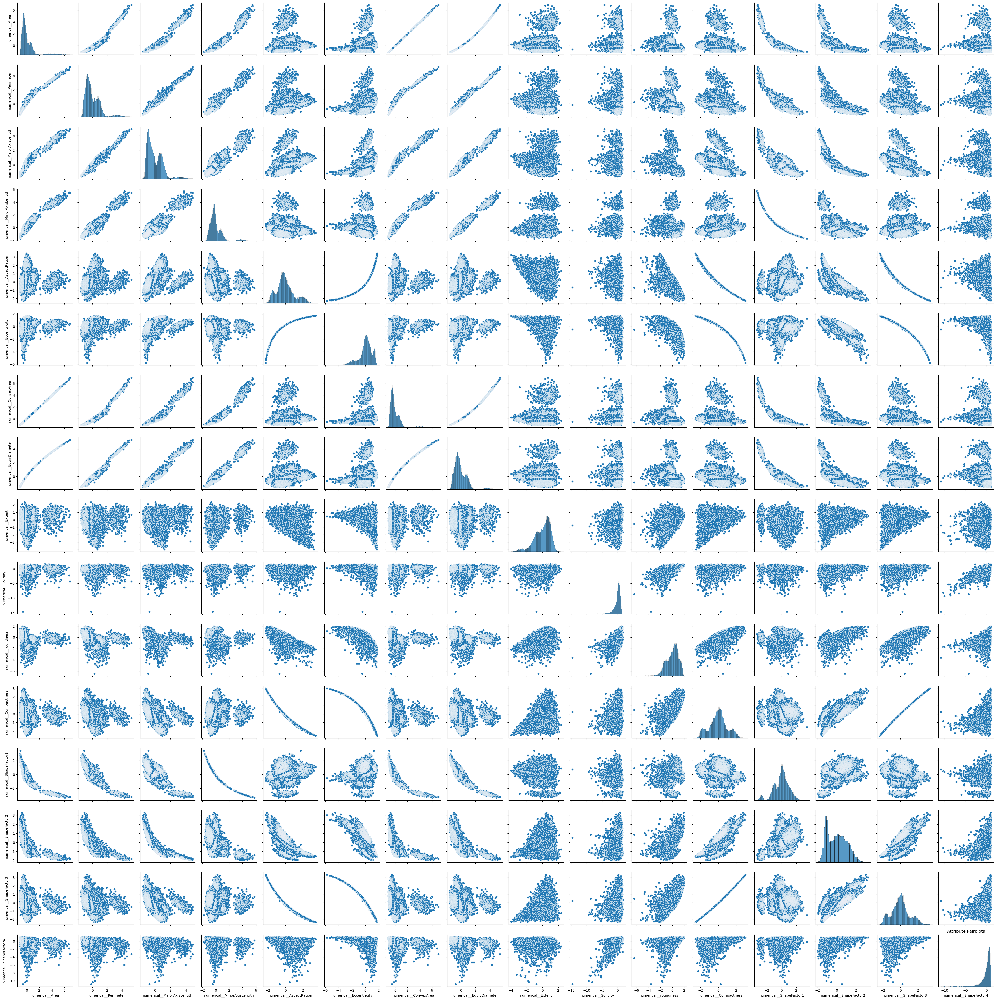

In [22]:
sns.pairplot(data=trans_df)
plt.title('Attribute Pairplots')
plt.tight_layout()
plt.show();

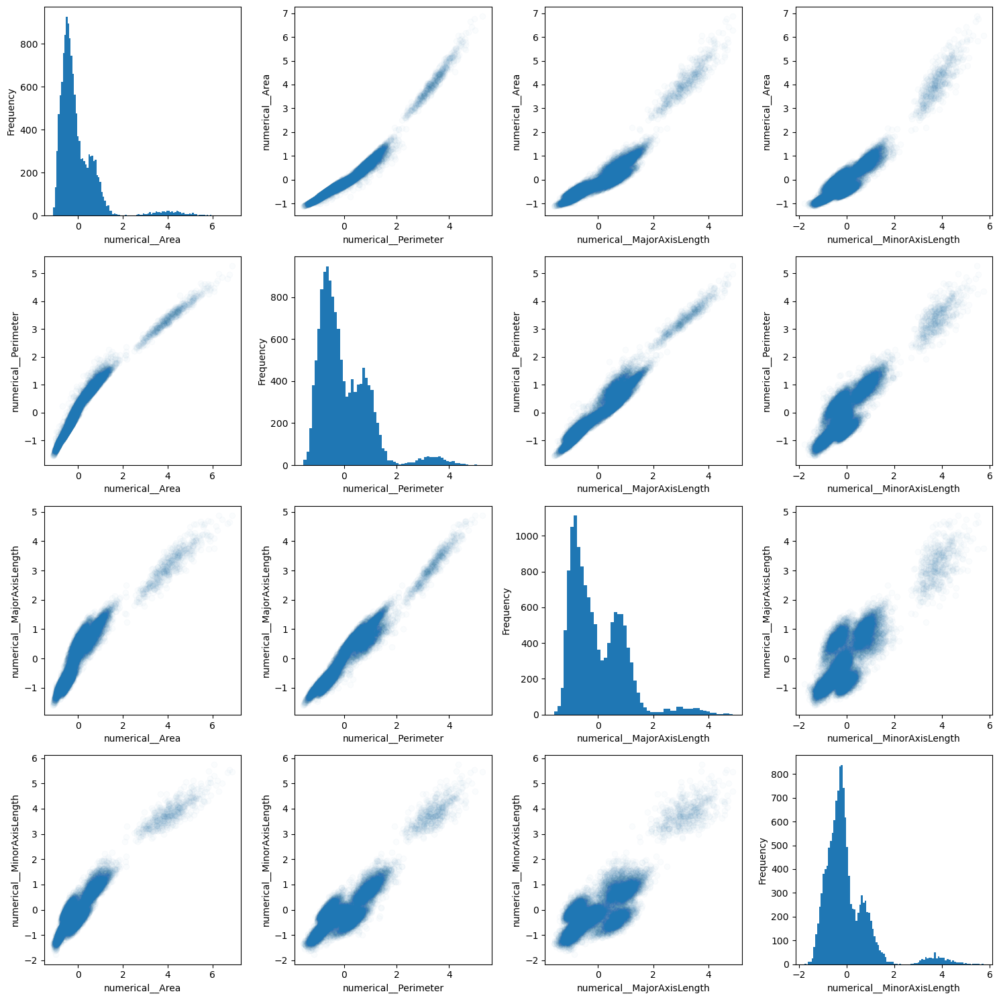

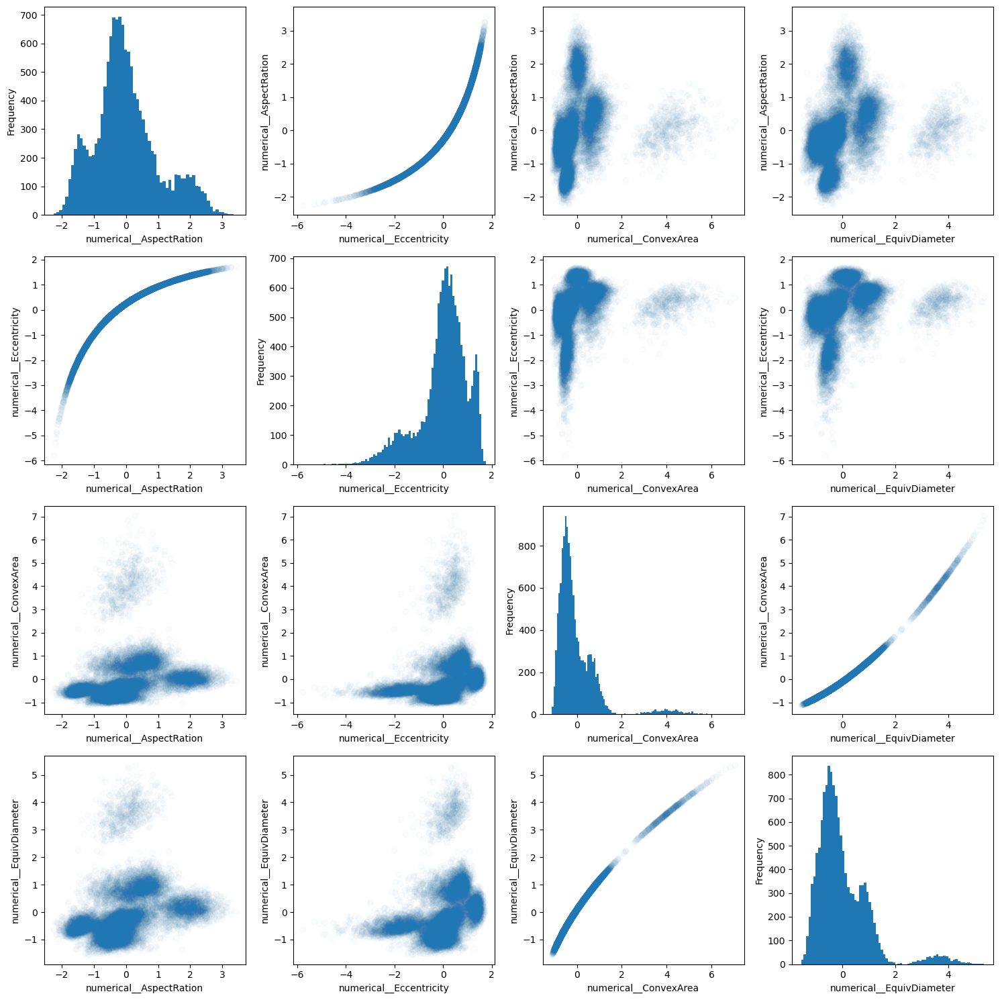

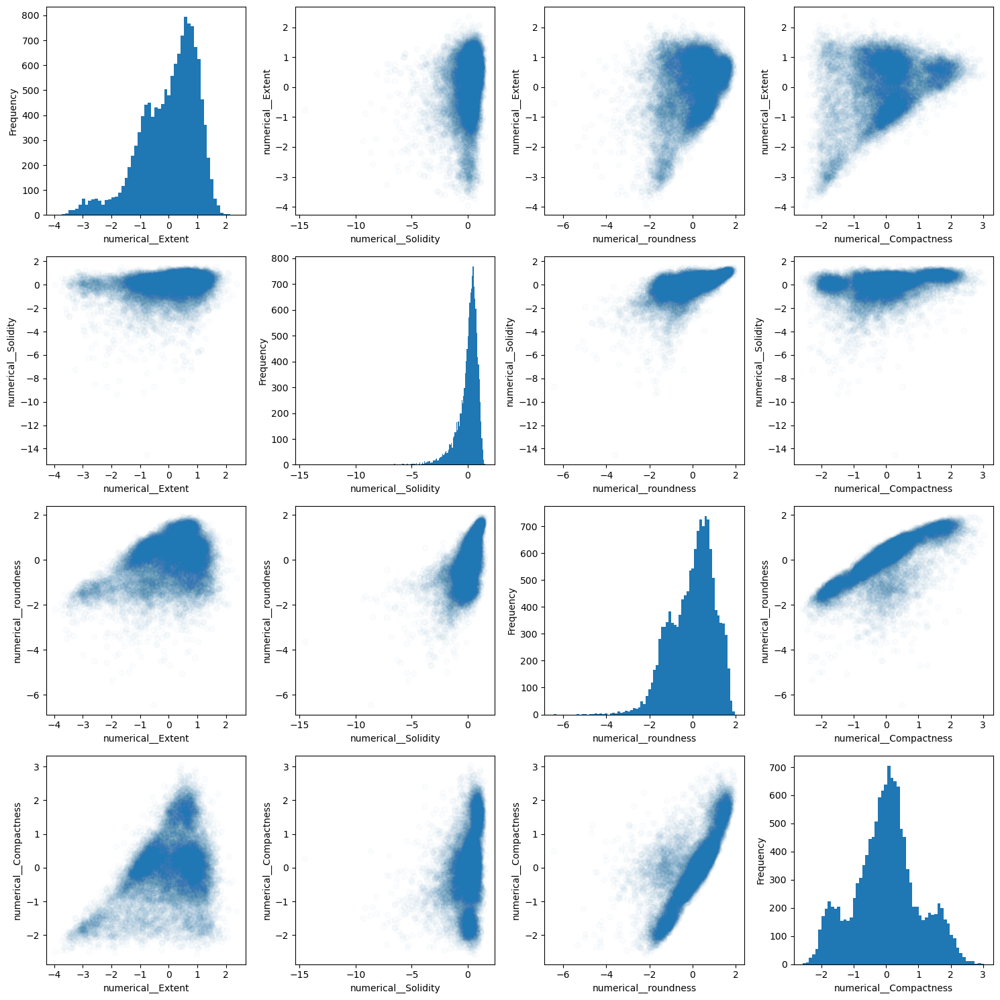

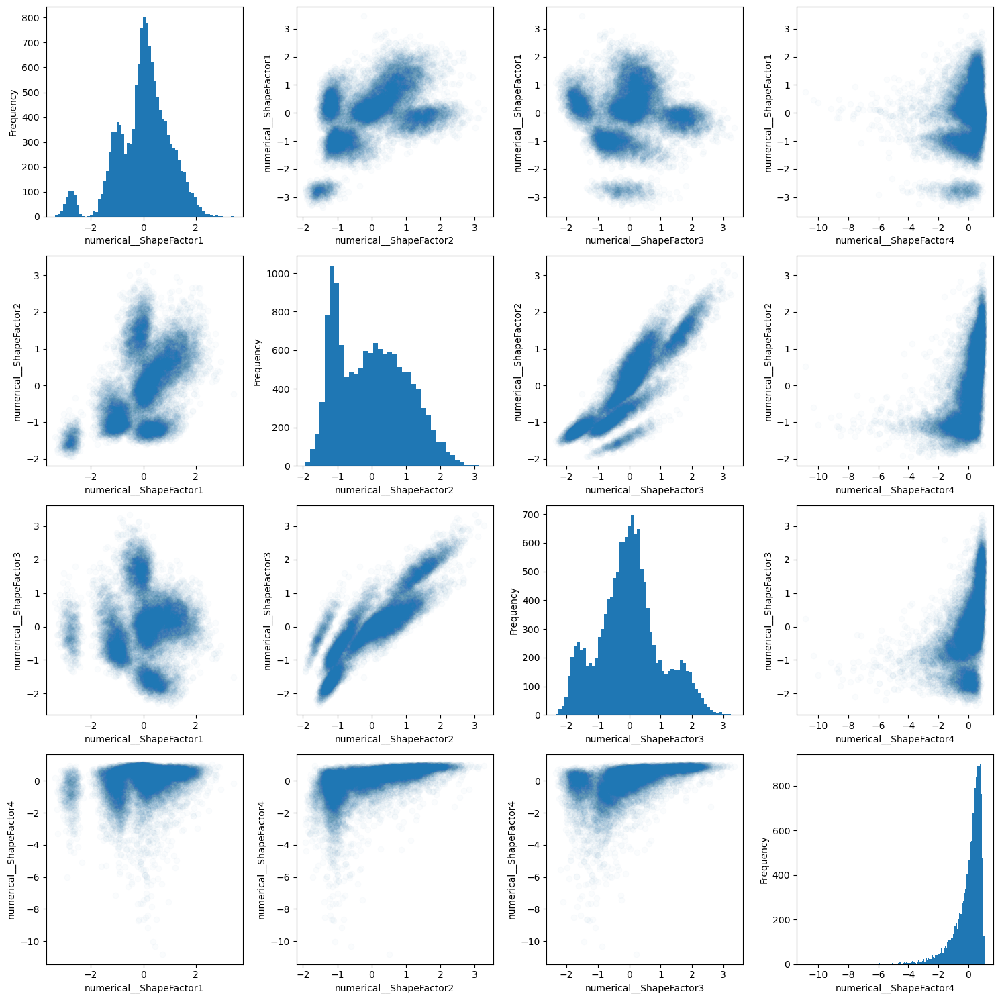

In [23]:
def sub_divide_pairplot(trans_df, alpha):

    columns = trans_df.columns

    for i in [0, 4, 8, 12]:


        # 4x4 subset of variables for the pairplot 
        subset_cols = columns[i:(i+4)]

        fig, axs = plt.subplots(len(subset_cols), len(subset_cols), figsize=(15, 15))

        for i, col1 in enumerate(subset_cols):
            for j, col2 in enumerate(subset_cols):
                if i == j:
                    # histograms on diagonals
                    axs[i, j].hist(trans_df[col1], bins='auto')
                    axs[i, j].set_xlabel(col1)
                    axs[i, j].set_ylabel("Frequency")
                else:
                    # scatter plots
                    axs[i, j].scatter(trans_df[col2], trans_df[col1], alpha=alpha, marker='o')
                    axs[i, j].set_xlabel(col2)
                    axs[i, j].set_ylabel(col1)

        plt.tight_layout()
        plt.show()

sub_divide_pairplot(trans_df, 0.02)

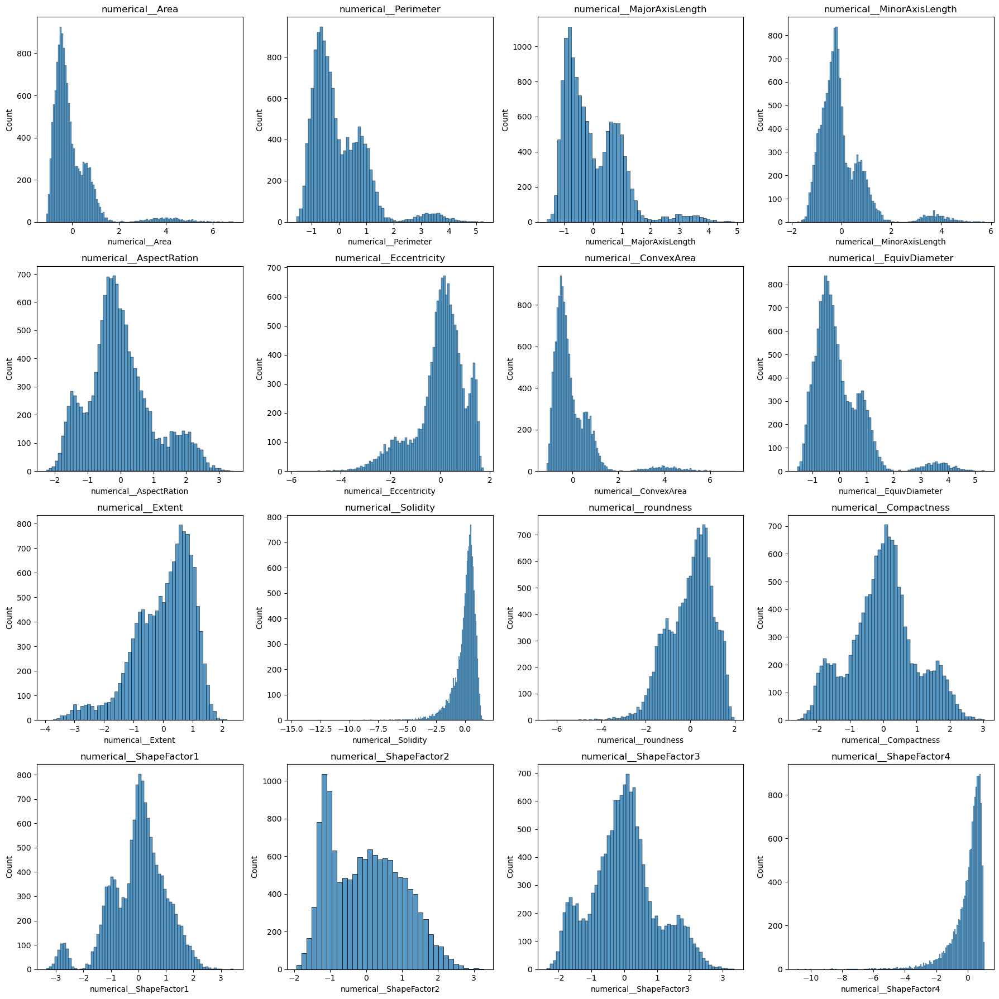

In [24]:
fig, ax = plt.subplots(4, 4, figsize=(18, 18))

col = 0
for num1 in range(4):
    for num2 in range(4):
            sns.histplot(data=trans_df.iloc[:, col], ax=ax[num1, num2])
            ax[num1, num2].set_title(trans_df.columns[col])
            col += 1

plt.tight_layout()
plt.show()
